### Библиотеки

In [1]:
import os, shutil, pathlib
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

In [2]:
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers import Dense, Conv2D, SeparableConv2D, BatchNormalization, add, concatenate, \
                                    MaxPooling2D, GlobalAveragePooling2D, Dropout, Activation, Flatten, Input
from keras.layers.preprocessing.image_preprocessing import RandomFlip, RandomZoom, RandomRotation, RandomBrightness, \
                                                           RandomContrast, RandomTranslation, RandomWidth, RandomHeight
import tensorflow as tf

import matplotlib.pyplot as plt
import numpy as np

### Датасет + data_augmentation

In [4]:
PATH_DATASET = r"C:\PycharmProjects\MachineLearningTF\datasets\cats_vs_dogs"

def make_subset(subset_name, start_index, end_index=None, num=None):
    if num:
        end_index = start_index + num
    for category in ("cat", "dog"):
        path = os.path.join(PATH_DATASET, subset_name, category)
        os.makedirs(path)
        fnames = [f"{i}.jpg" for i in range(start_index, end_index + 1000)]
        count = i = 0
        while count < (end_index - start_index):
            try:
                fname = fnames[i]
                img_path = os.path.join(PATH_DATASET, category, fnames[i])
                img_bytes = tf.io.read_file(img_path)
                tf.io.decode_image(img_bytes, channels=3)
                
                shutil.copyfile(src=img_path,
                                dst=os.path.join(path, fname))
                count += 1
            except Exception as e:
                print(f"{category}_{subset_name}\t{i=} image not found")
            finally:
                i += 1

# train val test (50-25-25)
# make_subset("train", start_index=0, num=2000)
# make_subset("validation", start_index=2100, num=1000)
# make_subset("test", start_index=3200, num=1500)

In [29]:
data_augmentation = Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.1),
    RandomZoom(0.1),
    RandomTranslation(height_factor=0.08, width_factor=0.08),
#     RandomHeight(factor=0.05),
#     RandomWidth(factor=0.05),
#     RandomBrightness(factor=(-.07, .07), value_range=[0., 1.]),
    RandomContrast(factor=.1),
])

In [30]:
train_dataset = image_dataset_from_directory(
    os.path.join(PATH_DATASET,  "train"),
    image_size=(260, 260), batch_size=32,
    label_mode="binary", color_mode="rgb")

validation_dataset = image_dataset_from_directory(
    os.path.join(PATH_DATASET, "validation"),
    image_size=(260, 260), batch_size=32,
    label_mode="binary", color_mode="rgb")

test_dataset = image_dataset_from_directory(
    os.path.join(PATH_DATASET, "test"),
    image_size=(260, 260), batch_size=32,
    label_mode="binary", color_mode="rgb")

train_dataset = train_dataset.prefetch(tf.data.AUTOTUNE).map(lambda x, y: (data_augmentation(x) / 255, y))  # data_augmentation
validation_dataset = validation_dataset.prefetch(tf.data.AUTOTUNE).map(lambda x, y: (x / 255, y))
test_dataset = test_dataset.prefetch(tf.data.AUTOTUNE).map(lambda x, y: (x / 255, y))

Found 4000 files belonging to 2 classes.
Found 2000 files belonging to 2 classes.
Found 3000 files belonging to 2 classes.


In [6]:
for data_batch, labels_batch in train_dataset:
    print("data batch shape:", data_batch.shape)
    print("labels batch shape:", labels_batch.shape)
    print(data_batch[0, 0])
    break

data batch shape: (32, 260, 260, 3)
labels batch shape: (32, 1)
tf.Tensor(
[[0.6002527  0.4729553  0.3521507 ]
 [0.5934764  0.47210065 0.35109755]
 [0.5853661  0.47333956 0.3507771 ]
 [0.5780359  0.4725073  0.3494116 ]
 [0.5765198  0.47188073 0.3502651 ]
 [0.5753828  0.47026554 0.35032332]
 [0.57202107 0.46652177 0.34772566]
 [0.56994116 0.46425882 0.3460114 ]
 [0.5713825  0.46582705 0.34719938]
 [0.57479334 0.46959767 0.34989056]
 [0.5765793  0.47184777 0.35058284]
 [0.5775292  0.47233784 0.3494534 ]
 [0.5834669  0.47320148 0.35032892]
 [0.5923026  0.47257668 0.3513098 ]
 [0.59898585 0.47236305 0.35168037]
 [0.6059201  0.47695884 0.35578033]
 [0.61042845 0.48120433 0.35982338]
 [0.61134803 0.48200384 0.36050278]
 [0.61469525 0.48529455 0.36373708]
 [0.6220362  0.49262443 0.3710558 ]
 [0.6261929  0.49684748 0.37535036]
 [0.6238607  0.49508038 0.37416843]
 [0.6194888  0.4925546  0.37350124]
 [0.61602336 0.491998   0.37570125]
 [0.6127869  0.4908088  0.37599584]
 [0.6077006  0.48614556 0

### Модели

- **simple**

In [20]:
model = Sequential([
    Input(shape=[260, 260, 3]),  # 254
    Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=128, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=256, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(),
    
    Flatten(),
    Dropout(0.5),
    Dense(32, activation='relu'),
    Dropout(0.15),
    Dense(1, activation='sigmoid'),
], name="model_simple")

- **Xception**

In [9]:
inputs = Input(shape=(260, 260, 3))
# x = Conv2D(filters=32, kernel_size=5, use_bias=False)(inputs)
x = Conv2D(filters=32, kernel_size=3, activation="relu")(inputs)
x = Conv2D(filters=32, kernel_size=3, use_bias=False)(x)

for size in [32, 64, 128, 256, 512]:
    residual = x
    
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = SeparableConv2D(size, 3, padding="same", use_bias=False)(x)
    
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = SeparableConv2D(size, 3, padding="same", use_bias=False)(x)
    
    x = MaxPooling2D(3, strides=2, padding="same")(x)
    residual = Conv2D(size, 1, strides=2, padding="same", use_bias=False)(residual)
    x = add([x, residual])

# x = Activation("relu")(BatchNormalization()(x))
x = GlobalAveragePooling2D()(x)
x = Dropout(0.4)(x)
x = Dropout(0.15)(Dense(128, activation="relu")(x))
x = Dropout(0.15)(Dense(128, activation="relu")(x))
outputs = Dense(1, activation="sigmoid")(x)
model = Model(inputs=inputs, outputs=outputs, name="model_XceptionV1")


In [19]:
inputs = Input(shape=(260, 260, 3))
x = Conv2D(filters=32, kernel_size=3, activation="relu")(inputs)
x = Conv2D(filters=32, kernel_size=3, activation="relu")(x)

for size in [32, 64, 128, 256, 512]:
    residual = Conv2D(size, 1, strides=2, padding="same", use_bias=False)(x)
    size, c_size = round(size * 0.75), round(size * 0.25)
    
    xc = Conv2D(c_size, 1, padding="same", use_bias=False)(x)
    xc = Conv2D(c_size, 3, padding="same", use_bias=False)(x)
    
    x = SeparableConv2D(size, 3, padding="same", use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = SeparableConv2D(size, 3, padding="same", use_bias=False)(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    
    x = concatenate([x, xc])
    x = MaxPooling2D(3, strides=2, padding="same")(x)
    x = add([x, residual])

x = Activation("relu")(BatchNormalization()(x))
x = MaxPooling2D()(x)
x = Flatten()(x)
x = Dropout(0.35)(x)
x = Dense(16, activation="relu")(x)
outputs = Dense(1, activation="sigmoid")(x)
model = Model(inputs=inputs, outputs=outputs, name="model_XceptionV2")

In [9]:
inputs = Input(shape=(260, 260, 3))
# x = Conv2D(filters=32, kernel_size=3, activation="relu")(inputs)
# x = Conv2D(filters=32, kernel_size=3, activation="relu")(x)

x = Conv2D(filters=32, kernel_size=3, use_bias=False)(inputs)
x = Activation("relu")(BatchNormalization()(x))
x = Conv2D(filters=32, kernel_size=3, use_bias=False)(x)
x = Activation("relu")(BatchNormalization()(x))

for size in [32, 64, 96, 128, 256]:
    residual = Conv2D(size, 1, strides=2, padding="same", use_bias=False)(x)
    
    x = SeparableConv2D(size, 3, padding="same", use_bias=False)(x)
    x = Activation("relu")(BatchNormalization()(x))
    
    x = SeparableConv2D(size, 3, padding="same", use_bias=False)(x)
    x = Activation("relu")(BatchNormalization()(x))
    
    x = MaxPooling2D(3, strides=2, padding="same")(x)
    x = add([x, residual])
    
for size in [512, 768]:
    residual = x
    
    x = SeparableConv2D(size, 3, padding="same", use_bias=False)(x)
    x = Activation("relu")(BatchNormalization()(x))
    
    x = concatenate([x, residual]) 
    x = MaxPooling2D(3, strides=2, padding="same")(x)

x = GlobalAveragePooling2D()(x)
x = Dropout(0.35)(x)
x = Dropout(0.2)(Dense(96, activation="relu")(x))
x = Dropout(0.2)(Dense(96, activation="relu")(x))
outputs = Dense(1, activation="sigmoid")(x)
model = Model(inputs=inputs, outputs=outputs, name="model_XceptionV3")

### Тренировка

In [10]:
model.compile(
    RMSprop(0.0007),  # Adam(0.0007)
    loss="binary_crossentropy",
    metrics=["accuracy"])

model.summary()

Model: "model_XceptionV3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 260, 260, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_7 (Conv2D)              (None, 258, 258, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_12 (BatchN  (None, 258, 258, 32  128        ['conv2d_7[0][0]']               
 ormalization)                  )                                                  

                                                                                                  
 separable_conv2d_17 (Separable  (None, 64, 64, 96)  10080       ['activation_18[0][0]']          
 Conv2D)                                                                                          
                                                                                                  
 batch_normalization_19 (BatchN  (None, 64, 64, 96)  384         ['separable_conv2d_17[0][0]']    
 ormalization)                                                                                    
                                                                                                  
 activation_19 (Activation)     (None, 64, 64, 96)   0           ['batch_normalization_19[0][0]'] 
                                                                                                  
 max_pooling2d_9 (MaxPooling2D)  (None, 32, 32, 96)  0           ['activation_19[0][0]']          
          

                                                                                                  
 activation_25 (Activation)     (None, 4, 4, 768)    0           ['batch_normalization_25[0][0]'] 
                                                                                                  
 concatenate_3 (Concatenate)    (None, 4, 4, 1536)   0           ['activation_25[0][0]',          
                                                                  'max_pooling2d_12[0][0]']       
                                                                                                  
 max_pooling2d_13 (MaxPooling2D  (None, 2, 2, 1536)  0           ['concatenate_3[0][0]']          
 )                                                                                                
                                                                                                  
 global_average_pooling2d_1 (Gl  (None, 1536)        0           ['max_pooling2d_13[0][0]']       
 obalAvera

In [11]:
# shutil.rmtree('logs')
# os.mkdir('logs')

callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath=f"{model.name}.keras",
        save_best_only=True,
        monitor="val_accuracy"),  # loss
    
    tf.keras.callbacks.EarlyStopping(
        monitor="val_accuracy",
        patience=7),
    
    tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.666,
        min_lr=6e-5,
        patience=2),
    
#     tf.keras.callbacks.TensorBoard(
#         log_dir="logs",
#         histogram_freq=2,
#         write_images=True),
]

history = model.fit(
    train_dataset, epochs=100,
    validation_data=test_dataset,
    callbacks=callbacks)

Epoch 1/100
125/125 [==============================] - 64s 492ms/step - loss: 0.7837 - accuracy: 0.5715 - val_loss: 0.6945 - val_accuracy: 0.5000 - lr: 7.0000e-04
Epoch 2/100
125/125 [==============================] - 61s 490ms/step - loss: 0.6728 - accuracy: 0.6090 - val_loss: 0.7559 - val_accuracy: 0.5000 - lr: 7.0000e-04
Epoch 3/100
125/125 [==============================] - 61s 490ms/step - loss: 0.6398 - accuracy: 0.6535 - val_loss: 0.8781 - val_accuracy: 0.5000 - lr: 7.0000e-04
Epoch 4/100
125/125 [==============================] - 61s 489ms/step - loss: 0.5887 - accuracy: 0.7000 - val_loss: 0.9459 - val_accuracy: 0.5000 - lr: 4.6620e-04
Epoch 5/100
125/125 [==============================] - 62s 495ms/step - loss: 0.5659 - accuracy: 0.7147 - val_loss: 0.7949 - val_accuracy: 0.6167 - lr: 4.6620e-04
Epoch 6/100
125/125 [==============================] - 62s 492ms/step - loss: 0.5420 - accuracy: 0.7335 - val_loss: 0.7592 - val_accuracy: 0.6310 - lr: 3.1049e-04
Epoch 7/100
125/125 [=

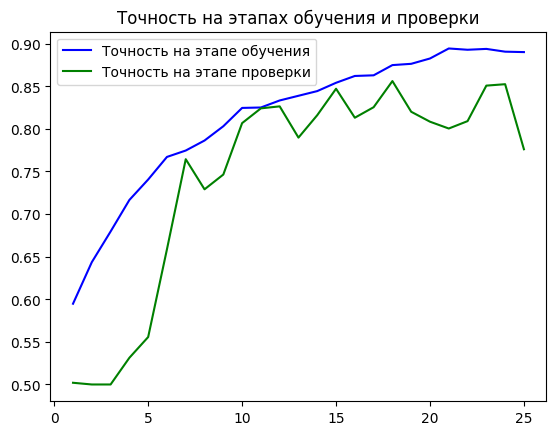

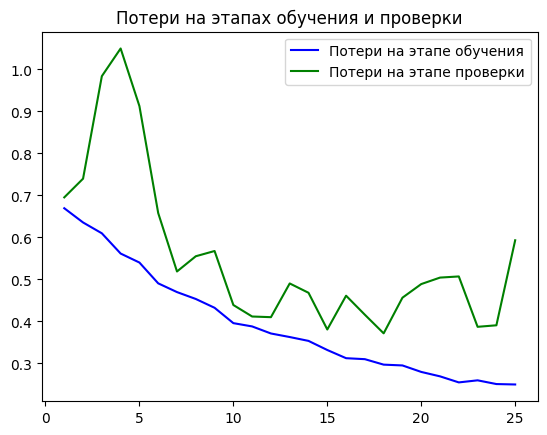

In [12]:
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]

epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, "b", label="Точность на этапе обучения")
plt.plot(epochs, val_accuracy, "g", label="Точность на этапе проверки")
plt.title("Точность на этапах обучения и проверки")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "b", label="Потери на этапе обучения")
plt.plot(epochs, val_loss, "g", label="Потери на этапе проверки")
plt.title("Потери на этапах обучения и проверки")
plt.legend()
plt.show()

### Loading models

In [6]:
%load_ext tensorboard

In [9]:
%tensorboard --port=8000 --logdir=logs 
# http://localhost:8000/

In [34]:
test_model = load_model("model_XceptionV2.keras")  
# model_simple(87.1) model_XceptionV1(85.6) model_XceptionV2(89.8) model_XceptionV3(85.4)
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}\nLoss: {test_loss:.3f}")

94/94 [==============================] - 7s 65ms/step - loss: 0.2807 - accuracy: 0.8983
Test accuracy: 0.898
Loss: 0.281


### Model interpritation

- **1 Визуализация промежуточных активаций**

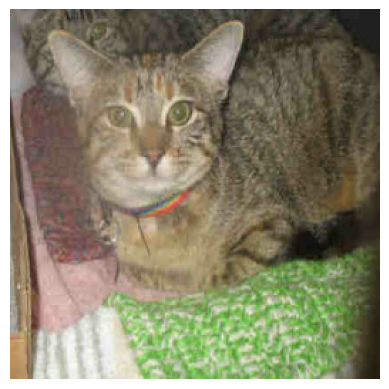

In [86]:
for data, labels in test_dataset.take(1):
    test_image, label = np.array([data[0]]), float(labels[0])
    plt.axis("off")
    plt.imshow(test_image[0])
    plt.show()

In [78]:
test_model = load_model("model_simple.keras")  # model_simple model_XceptionV1 model_XceptionV2 model_XceptionV3
# test_model.summary()

layer_outputs = []
layer_names = []
for layer in test_model.layers:
    if isinstance(layer, (Conv2D, SeparableConv2D, MaxPooling2D)):
        layer_outputs.append(layer.output)
        layer_names.append(layer.name)

activation_model = Model(inputs=test_model.input, outputs=layer_outputs)
activations = activation_model.predict(test_image)
test_model.summary()
print(test_model.predict(test_image))

1/1 [==============================] - 0s 62ms/step
Model: "model_simple"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 258, 258, 64)      1792      
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 129, 129, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_22 (Conv2D)          (None, 127, 127, 64)      36928     
                                                                 
 max_pooling2d_16 (MaxPoolin  (None, 63, 63, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 61, 61, 128)       73856     
                                                                 
 m

['conv2d_21', 'max_pooling2d_15', 'conv2d_22', 'max_pooling2d_16', 'conv2d_23', 'max_pooling2d_17', 'conv2d_24', 'max_pooling2d_18', 'conv2d_25', 'max_pooling2d_19'] 10


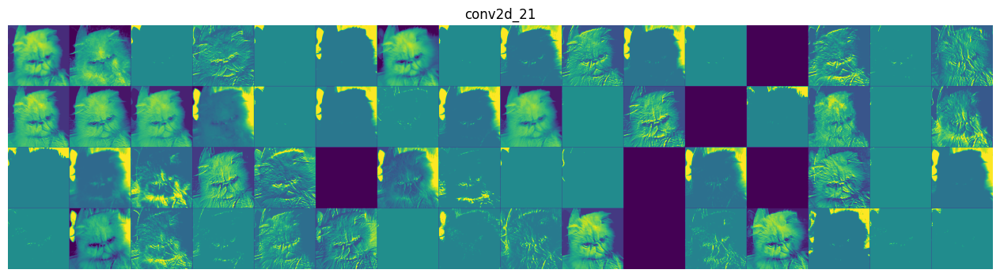

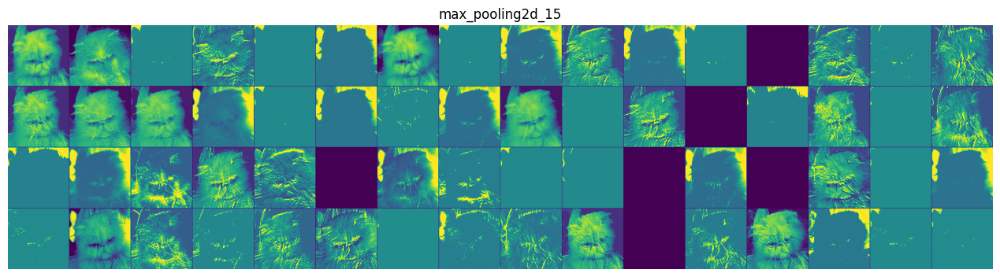

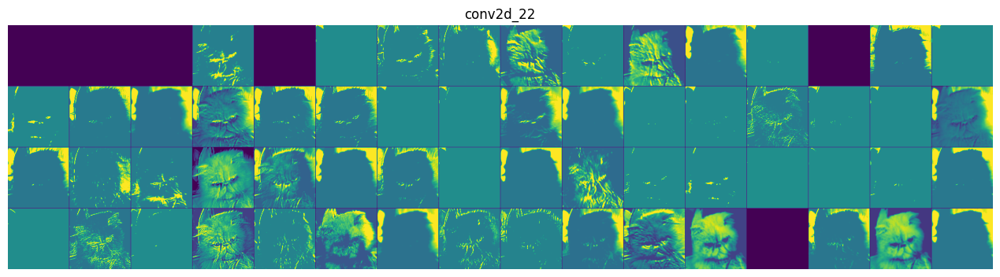

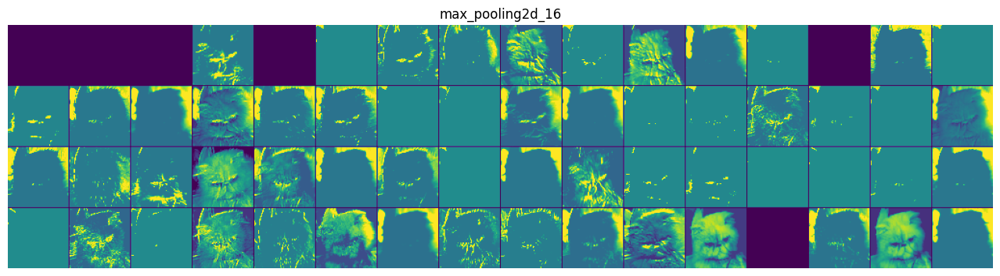

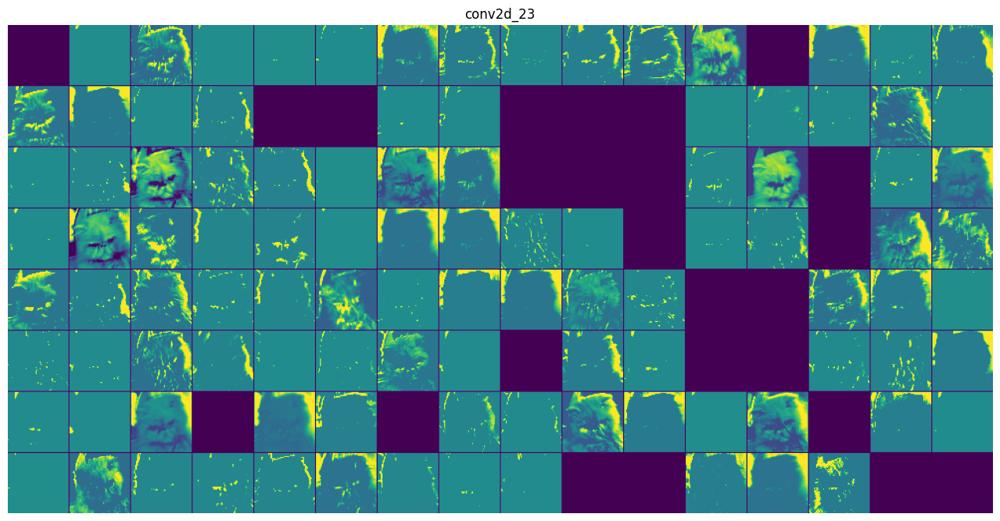

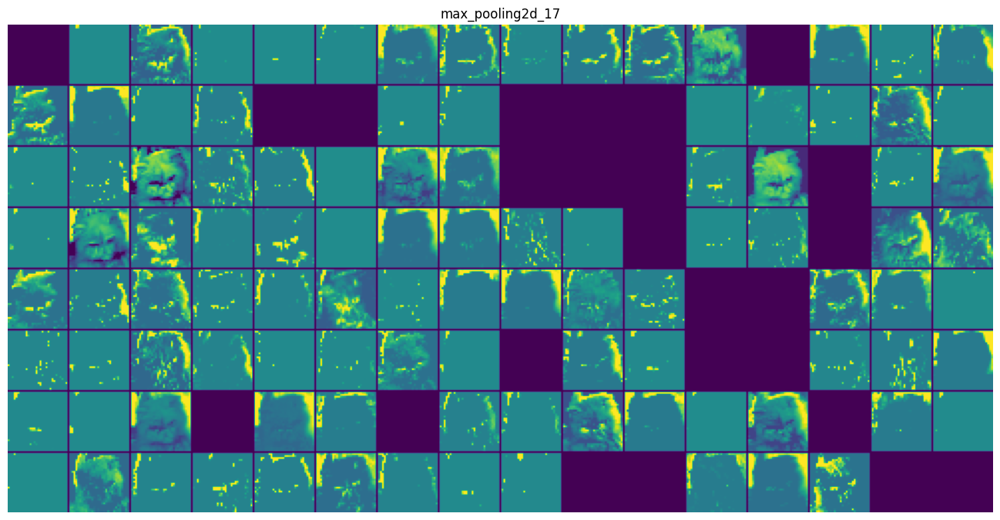

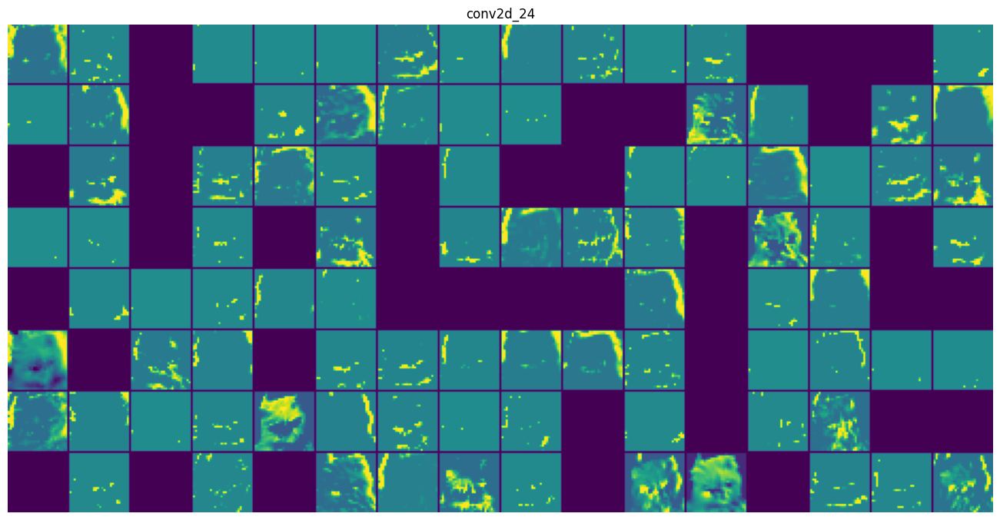

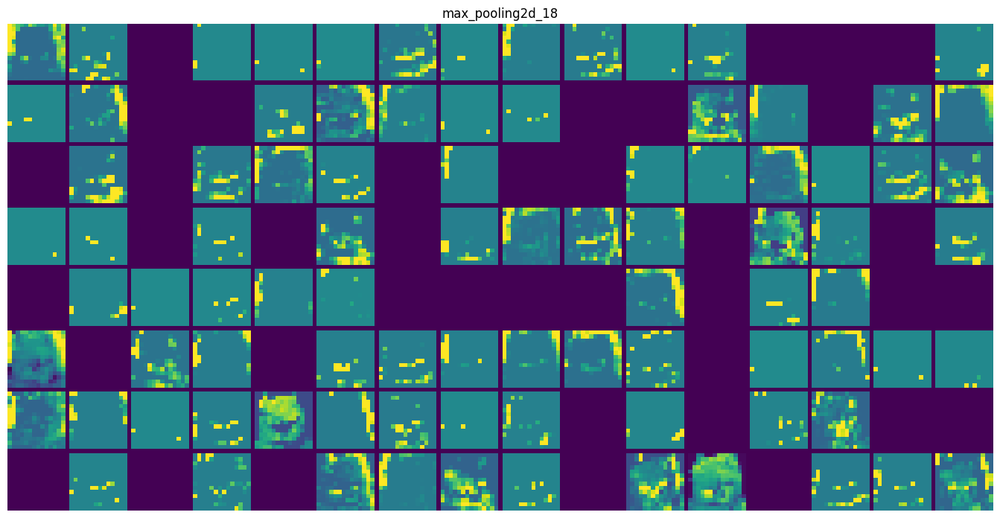

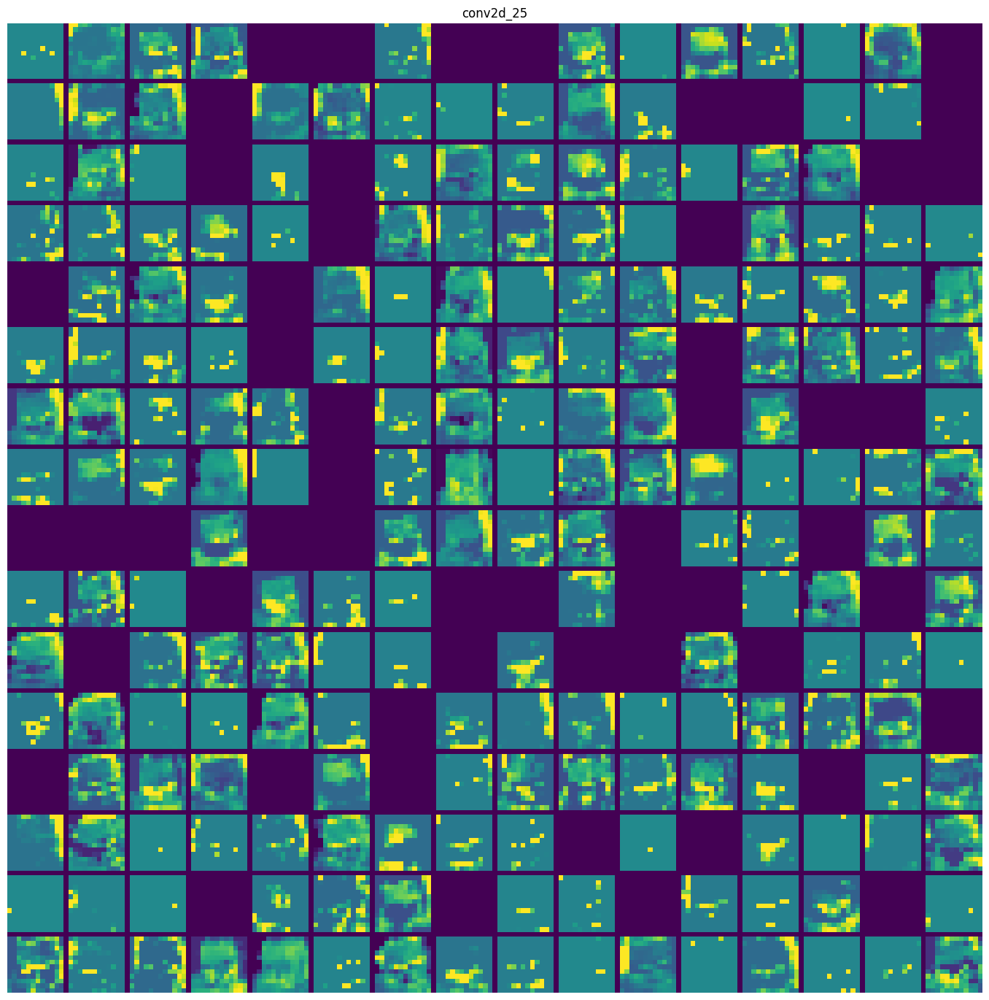

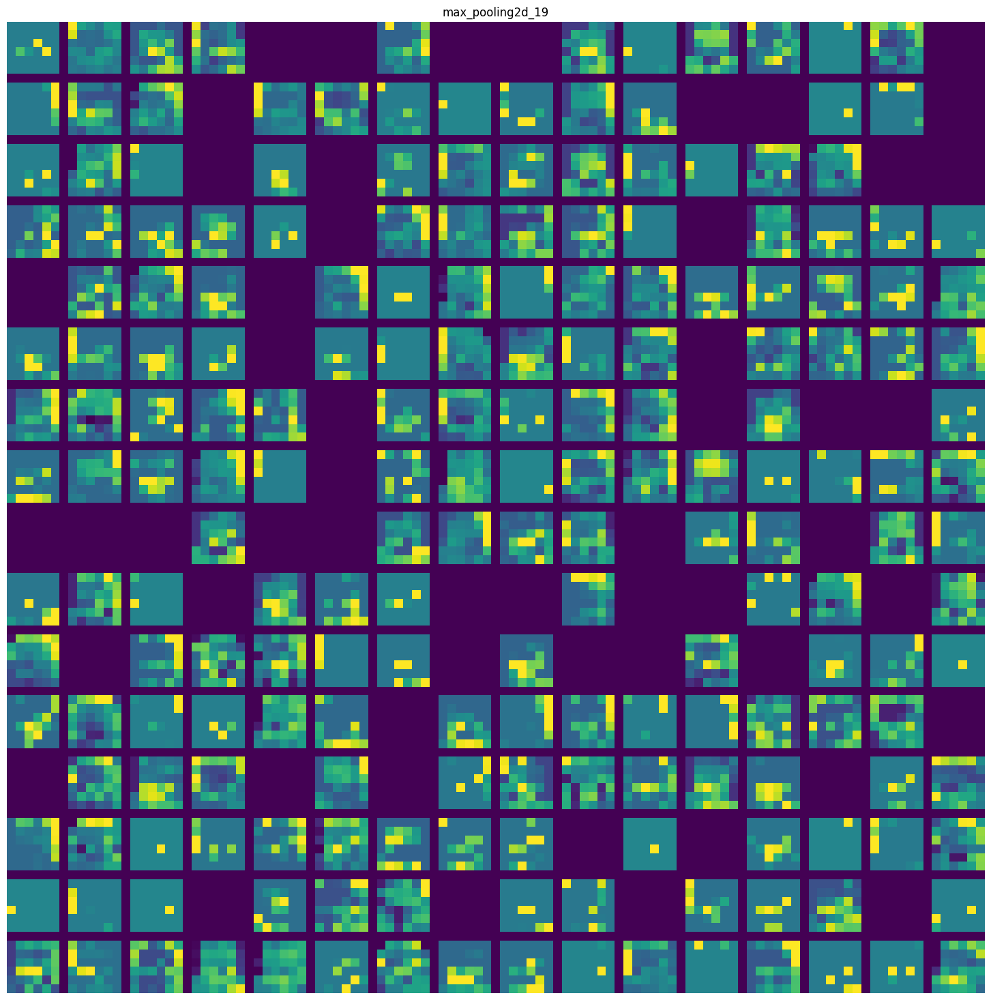

In [79]:
print(layer_names, len(activations))
# idx = layer_names.index('conv2d_23')
# slice_act = activations[idx][0]
# print(slice_act.shape)
# count = slice_act.shape[-1]
# plt.figure(figsize=(12, count))
# for i in range(count):
#     plt.subplot(count // 4 + 1, 4, i + 1)
#     plt.axis("off")
#     plt.title(f"Slice {idx}_{i}")
#     plt.imshow(slice_act[:, :, i], cmap="viridis")

images_per_row = 16  # 8 16 Кратно всем признакам!
for layer_name, layer_activation in zip(layer_names[:], activations[:]):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros(((size + 1) * n_cols - 1, images_per_row * (size + 1) - 1))
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_index = col * images_per_row + row
            channel_image = layer_activation[0, :, :, channel_index].copy()
            if channel_image.sum() != 0:
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype("uint8")
            display_grid[
                col * (size + 1): (col + 1) * size + col,
                row * (size + 1) : (row + 1) * size + row] = channel_image
    scale = 1. / size  # 1.5 1.
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.axis("off")
    plt.imshow(display_grid, aspect="auto", cmap="viridis")

- **2 Визуализация фильтров сверточной сети**

In [114]:
test_model = tf.keras.applications.xception.Xception(weights="imagenet", include_top=True)
# test_model.summary()

layer_names = []
for layer in test_model.layers:
    if isinstance(layer, (Conv2D, SeparableConv2D)):
        layer_names.append(layer.name)

print(layer_names, len(layer_names))
layer_name = "block8_sepconv1"
layer_target = test_model.get_layer(name=layer_name)
model_extractor = Model(inputs=test_model.input, outputs=layer_target.output)

def compute_loss(image, filter_index):
    activation = model_extractor(image)
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

@tf.function
def gradient_ascent_step(image, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(image)
        loss = compute_loss(image, filter_index)
    grads = tape.gradient(loss, image)
    grads = tf.math.l2_normalize(grads)
    image += learning_rate * grads
    return image

img_width = 299
img_height = 299
def generate_filter_pattern(filter_index):
    iterations = 30     # 30
    learning_rate = 10  # 10
    image = tf.random.uniform(minval=0.4, maxval=0.6, shape=(1, img_width, img_height, 3))
#     print(compute_loss(image, filter_index))
    for i in range(iterations):
        image = gradient_ascent_step(image, filter_index, learning_rate)
#     print(compute_loss(image, filter_index))
    return image[0].numpy()

def deprocess_image(image):
    image -= image.mean()
    image /= image.std()
    image *= 64
    image += 128
    image = np.clip(image, 0, 255).astype("uint8")
    image = image[25:-25, 25:-25, :]  # Border artefacts
    return image

Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 149, 149, 32  864         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 149, 149, 32  128        ['block1_conv1[0][0]']           
 ation)                         )                                                          

 block4_sepconv1_bn (BatchNorma  (None, 37, 37, 728)  2912       ['block4_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block4_sepconv2_act (Activatio  (None, 37, 37, 728)  0          ['block4_sepconv1_bn[0][0]']     
 n)                                                                                               
                                                                                                  
 block4_sepconv2 (SeparableConv  (None, 37, 37, 728)  536536     ['block4_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block4_sepconv2_bn (BatchNorma  (None, 37, 37, 728)  2912       ['block4_sepconv2[0][0]']        
 lization)

 n)                                                                                               
                                                                                                  
 block7_sepconv1 (SeparableConv  (None, 19, 19, 728)  536536     ['block7_sepconv1_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block7_sepconv1_bn (BatchNorma  (None, 19, 19, 728)  2912       ['block7_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block7_sepconv2_act (Activatio  (None, 19, 19, 728)  0          ['block7_sepconv1_bn[0][0]']     
 n)                                                                                               
          

 block9_sepconv3_bn (BatchNorma  (None, 19, 19, 728)  2912       ['block9_sepconv3[0][0]']        
 lization)                                                                                        
                                                                                                  
 add_31 (Add)                   (None, 19, 19, 728)  0           ['block9_sepconv3_bn[0][0]',     
                                                                  'add_30[0][0]']                 
                                                                                                  
 block10_sepconv1_act (Activati  (None, 19, 19, 728)  0          ['add_31[0][0]']                 
 on)                                                                                              
                                                                                                  
 block10_sepconv1 (SeparableCon  (None, 19, 19, 728)  536536     ['block10_sepconv1_act[0][0]']   
 v2D)     

                                                                                                  
 block12_sepconv3_act (Activati  (None, 19, 19, 728)  0          ['block12_sepconv2_bn[0][0]']    
 on)                                                                                              
                                                                                                  
 block12_sepconv3 (SeparableCon  (None, 19, 19, 728)  536536     ['block12_sepconv3_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block12_sepconv3_bn (BatchNorm  (None, 19, 19, 728)  2912       ['block12_sepconv3[0][0]']       
 alization)                                                                                       
                                                                                                  
 add_34 (A

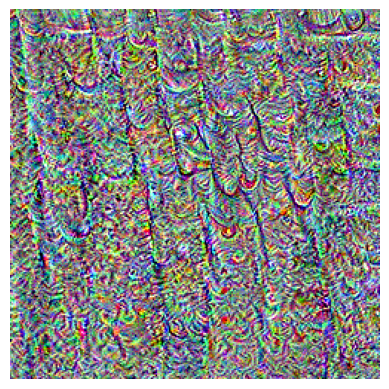

In [112]:
plt.axis("off")
plt.imshow(deprocess_image(generate_filter_pattern(filter_index=7)))
plt.show()

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24
Processing filter 25
Processing filter 26
Processing filter 27
Processing filter 28
Processing filter 29
Processing filter 30
Processing filter 31
Processing filter 32
Processing filter 33
Processing filter 34
Processing filter 35
Processing filter 36
Processing filter 37
Processing filter 38
Processing filter 39
Processing filter 40
Processing filter 41
Processing filter 42
Processing filter 43
Processing filter 44
Processing filter 45
Processing filter 46
Processing filter 47
Pr

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


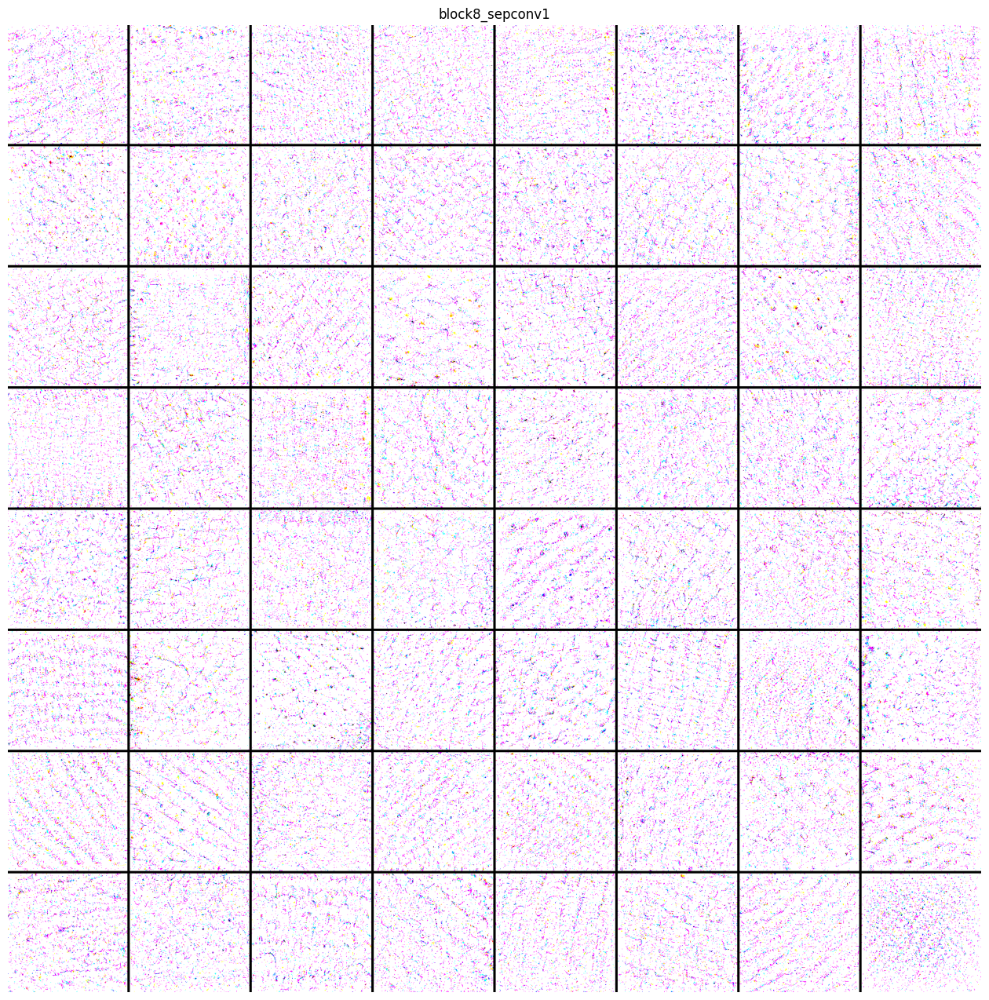

In [113]:
all_images = []
for filter_index in range(64):  # Первые 64 фильтра
    print(f"Processing filter {filter_index}")
    image = deprocess_image(generate_filter_pattern(filter_index))
    all_images.append(image)

n = 8  # кратно фильтрам n**2
margin = 5
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

for i in range(n):
    for j in range(n):
        current_image = all_images[i * n + j]

        row_start = (cropped_width + margin) * i
        row_end = (cropped_width + margin) * i + cropped_width
        column_start = (cropped_height + margin) * j
        column_end = (cropped_height + margin) * j + cropped_height
        
        stitched_filters[row_start:row_end, column_start:column_end, :] = current_image
            
            
plt.figure(figsize=(n*2, n*2))
plt.title(layer_name)
plt.grid(False)
plt.axis("off")
plt.imshow(stitched_filters, aspect="auto", cmap="viridis")
print(stitched_filters)
print(np.max(stitched_filters))
print(np.min(stitched_filters))
print(np.mean(stitched_filters))

tf.keras.utils.save_img(f"filters_for_layer_{layer_name}.png", stitched_filters)

- **3 Визуализация тепловых карт активации класса**

0.93333334
0.0


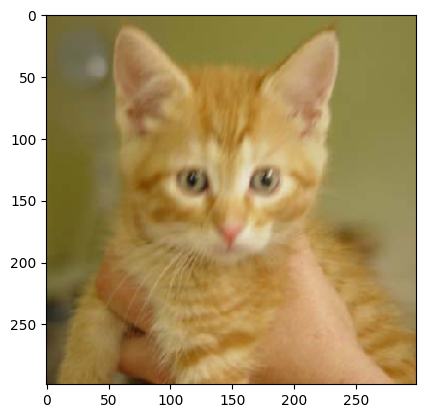

In [10]:
def get_img_array(img_path, target_size):
    img = tf.keras.utils.load_img(img_path, target_size=target_size)
    array = tf.keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    array = tf.keras.applications.xception.preprocess_input(array)
    return array

img_path = os.path.join(PATH_DATASET, 'test', 'cat', '3405.jpg')
img_array = get_img_array(img_path, target_size=(299, 299))

plt.axis('off')
plt.imshow(img_array[0] / 2 + 0.5)
plt.show()

In [13]:
test_model = tf.keras.applications.xception.Xception(weights="imagenet", include_top=True)
# test_model.summary()

preds = test_model.predict(img_array)
print(*tf.keras.applications.xception.decode_predictions(preds, top=5)[0], sep='\n')

1/1 [==============================] - 0s 498ms/step
('n02123159', 'tiger_cat', 0.39271367)
('n02123045', 'tabby', 0.28947005)
('n02124075', 'Egyptian_cat', 0.21381772)
('n02127052', 'lynx', 0.005285608)
('n02138441', 'meerkat', 0.0032287512)


In [16]:
last_conv_layer_name = "block14_sepconv2_act"
last_conv_layer = test_model.get_layer(last_conv_layer_name)
last_conv_layer_model = Model(test_model.inputs, last_conv_layer.output)


classifier_input = Input(shape=last_conv_layer.output.shape[1:])
x = classifier_input
for layer_name in ["avg_pool", "predictions"]:
    x = test_model.get_layer(layer_name)(x)
classifier_model = Model(classifier_input, x)

In [17]:
with tf.GradientTape() as tape:
    last_conv_layer_output = last_conv_layer_model(img_array)
    tape.watch(last_conv_layer_output)
    preds = classifier_model(last_conv_layer_output)
    top_pred_index = tf.argmax(preds[0])
    top_class_channel = preds[:, top_pred_index]  # loss for class
    
grads = tape.gradient(top_class_channel, last_conv_layer_output)

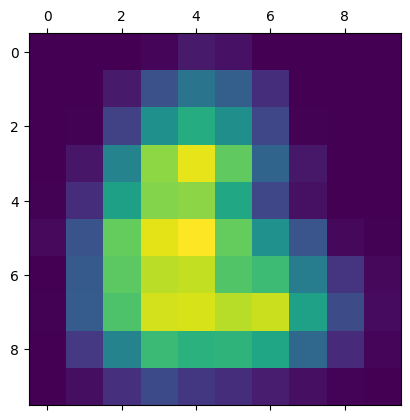

In [18]:
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy()
last_conv_layer_output = last_conv_layer_output.numpy()[0]
for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, :, i] *= pooled_grads[i]
    
heatmap = np.mean(last_conv_layer_output, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

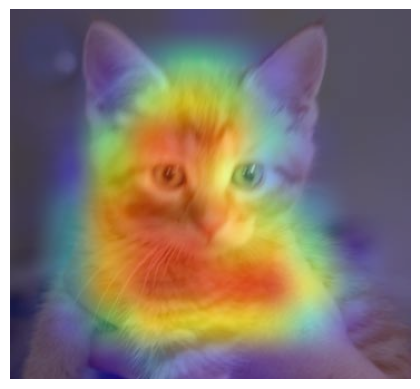

In [27]:
import matplotlib.cm as cm

img = tf.keras.utils.load_img(img_path)
img = tf.keras.utils.img_to_array(img)
heatmap = np.uint8(255 * heatmap)

jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]
jet_heatmap = jet_colors[heatmap]
jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)
jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)

superimposed_img = jet_heatmap * 0.7 + img
superimposed_img = tf.keras.utils.array_to_img(superimposed_img)
save_path = "CAM_heatmap_img.jpg"
superimposed_img.save(save_path)

plt.axis('off')
plt.imshow(superimposed_img)
plt.show()

# print(np.shape(superimposed_img))
# print(np.min(superimposed_img))
# print(np.max(superimposed_img))
# print(np.mean(superimposed_img))

#### Show test work

(16, 260, 260, 3) (16, 1)


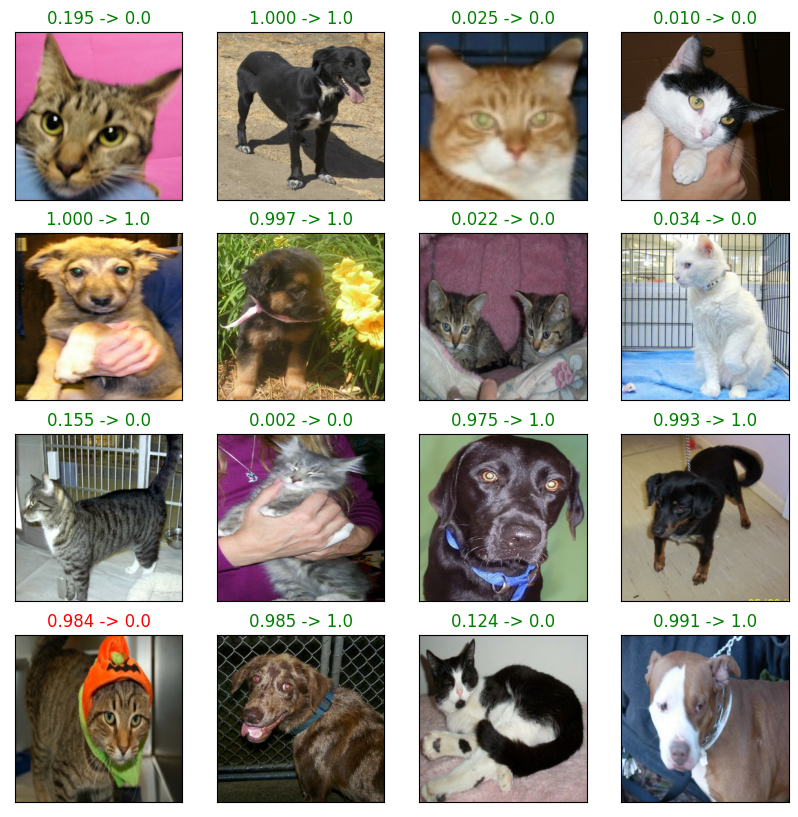

(16, 260, 260, 3) (16, 1)


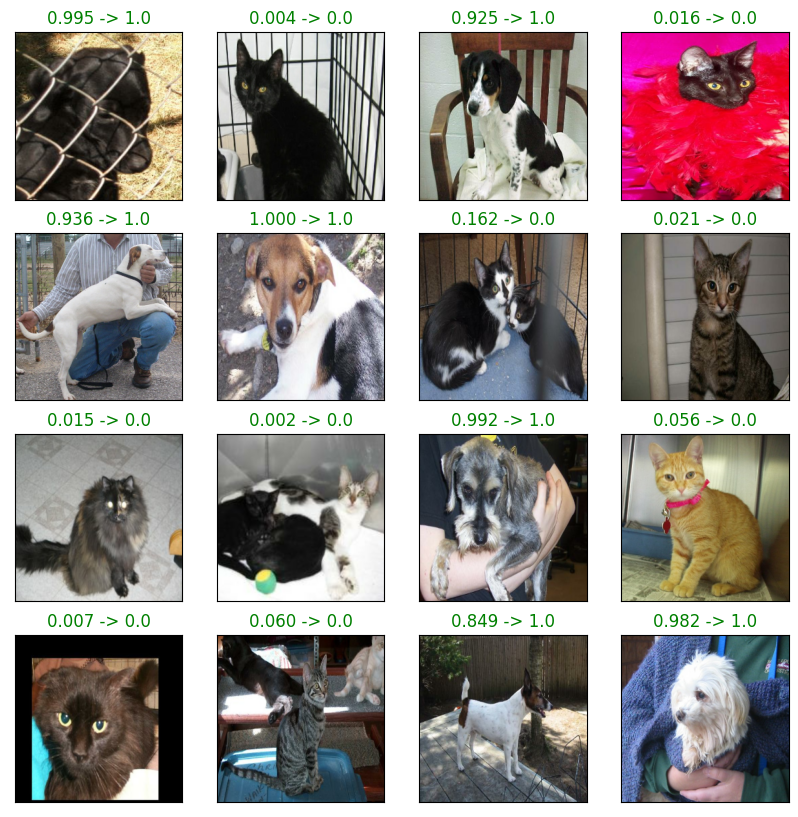

(16, 260, 260, 3) (16, 1)


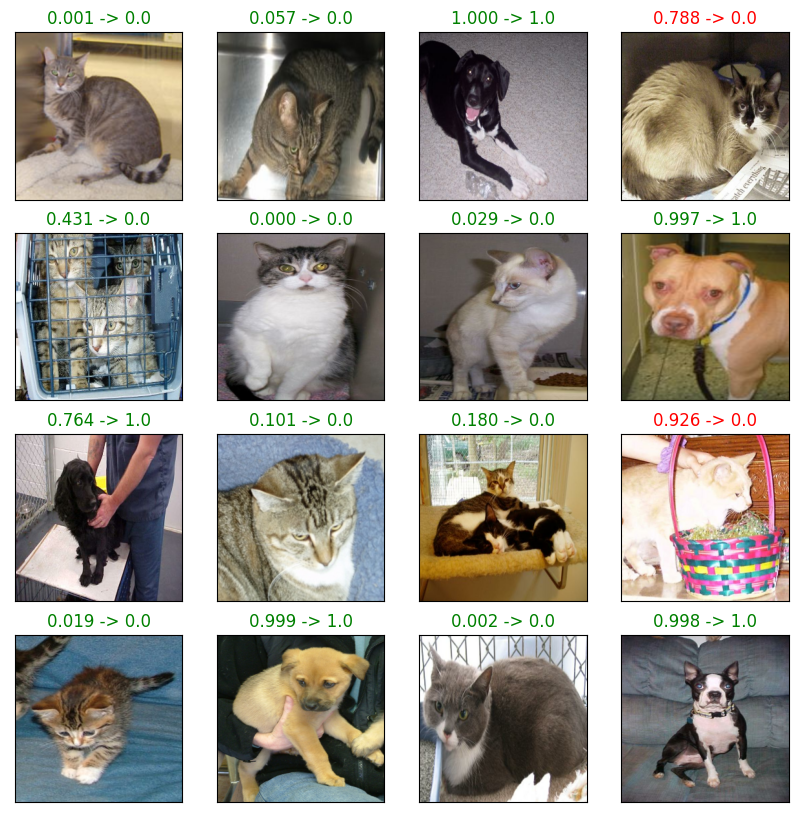

(16, 260, 260, 3) (16, 1)


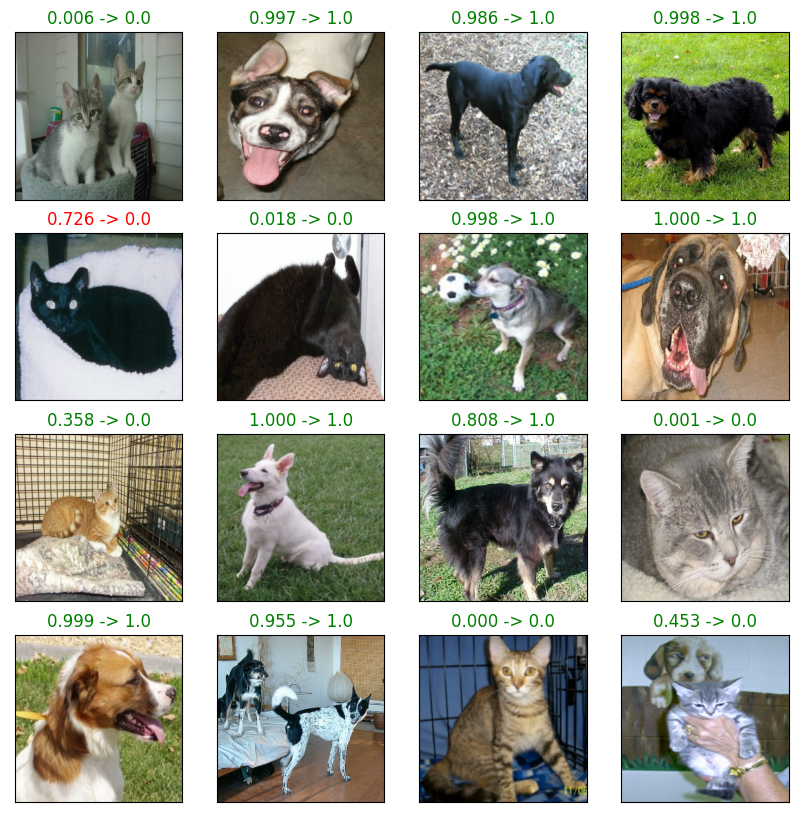

(16, 260, 260, 3) (16, 1)


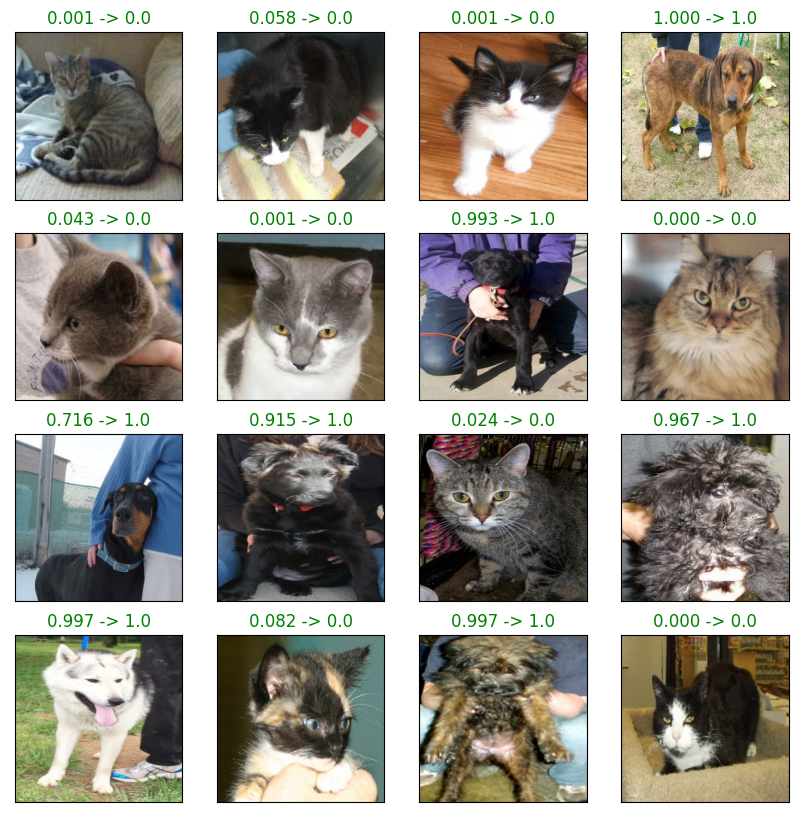

In [35]:
# Test
for data, labels in test_dataset.take(5):
    data = data[:16]
    labels = labels[:16]
    print(data.shape, labels.shape)
    predict = test_model.predict(data, verbose=0)
    plt.figure(figsize=(10, 10))
    for i in range(16):
        plt.subplot(4, 4, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        i1, i2 = labels[i].numpy()[0], predict[i][0]
        plt.title(f'{i2:.3f} -> {i1}', c='green' if i1 == round(i2) else 'red')
        plt.imshow(data[i])
    plt.show()
